In [6]:
# import libraries
import os
import cv2
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
from matplotlib import pyplot as plt
from tensorflow import keras, random
from tensorflow.keras.applications import InceptionV3, MobileNetV2
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, recall_score, precision_score, ConfusionMatrixDisplay
from keras import layers, models, preprocessing
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Concatenate, Input
from tensorflow.keras.models import Model

In [7]:
# make it reproducible
tf.keras.backend.clear_session()
seed_num = 42
tf.random.set_seed(seed_num)
tf.keras.utils.set_random_seed(seed_num)
keras.utils.set_random_seed(seed_num)

In [8]:
train_dir = "tomato_diseases/train"
test_dir = "tomato_diseases/test"

batch_size = 32
img_size = 224

In [9]:
redundant_file = "/.DS_Store"
if os.path.exists(train_dir +"/"+ redundant_file):
    os.remove(train_dir +"/"+ redundant_file)
if os.path.exists(test_dir +"/"+ redundant_file):
    os.remove(test_dir +"/"+ redundant_file)

class_names = sorted(os.listdir(train_dir))
print("Number of classes: ", len(class_names))
print("List of classes: ", class_names)

Number of classes:  10
List of classes:  ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


In [10]:
nums = {}
for disease in class_names:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Bacterial_spot,1701
Tomato___Early_blight,800
Tomato___Late_blight,1527
Tomato___Leaf_Mold,761
Tomato___Septoria_leaf_spot,1416
Tomato___Spider_mites Two-spotted_spider_mite,1340
Tomato___Target_Spot,1123
Tomato___Tomato_Yellow_Leaf_Curl_Virus,4285
Tomato___Tomato_mosaic_virus,298
Tomato___healthy,1272


Text(0.5, 1.0, 'Images per each class of plant disease')

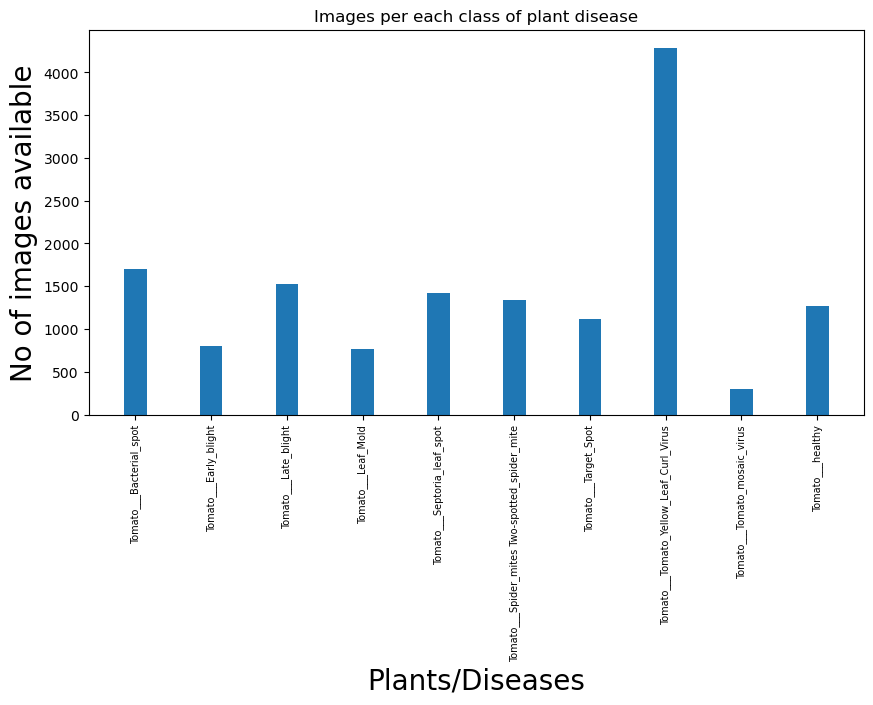

In [11]:
# plotting number of images available for each disease
index = [n for n in range(10)]
plt.figure(figsize=(10, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=20)
plt.ylabel('No of images available', fontsize=20)
plt.xticks(index, class_names, fontsize=7, rotation=90)
plt.title('Images per each class of plant disease')

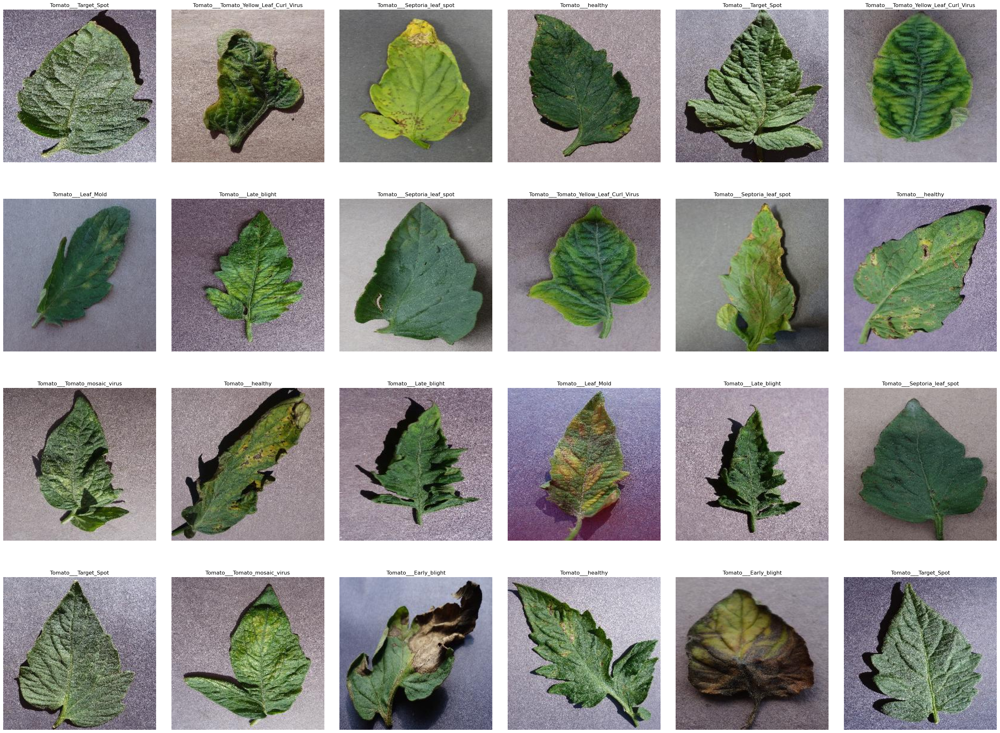

In [5]:
# Display Random Images

plt.figure(figsize=(40,30))#Set figure size to 40 inches in width and 30 inches in height
plt.subplots_adjust(wspace=0.1,hspace=0.1)# width and height space between subplots to 0.1

# Iterate over a range of 24 (to display 24 images)
for i in range(24):
    #Get a random folder index within the range of available folders in the training data
    random_folder = np.random.randint(0, len(os.listdir(train_dir)))
    #Get the path of the randomly selected folder
    random_folder_path = os.path.join(train_dir, os.listdir(train_dir)[random_folder])  
    #Get a random image index within the range of available images in the selected folder
    random_image = np.random.randint(0, len(os.listdir(random_folder_path))) 
    
    #Get the path of the randomly selected image and Read the image using OpenCV
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])  
    image = cv2.imread(random_image_path)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert the image from (BGR to RGB) 
    
    #Get the class name for the current image
    class_name = class_names[random_folder]  
    
    # Create a subplot with 4 rows and 6 columns, and set the current subplot index
    plt.subplot(4, 6, i + 1)  
    plt.imshow(image)#Display the image
    plt.axis("off")#Turn off the axis
    plt.title(class_name)#Set the title of the subplot to the class name  
    
# Display the entire plot
plt.show()

In [6]:
# Loading data for training and testing
data_generator = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

In [7]:
#

training_dataset = data_generator.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='training',
    shuffle=True,
    class_mode='categorical'
)
validation_dataset = data_generator.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    subset='validation',  #2. changed this from training to validation
    class_mode='categorical'
)

testing_dataset = data_generator.flow_from_directory(
    directory=test_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 11621 images belonging to 10 classes.
Found 2902 images belonging to 10 classes.
Found 3637 images belonging to 10 classes.


In [8]:
# Create a mapping from class indices to class names
class_indices = {v: k for k, v in training_dataset.class_indices.items()}
class_indices

{0: 'Tomato___Bacterial_spot',
 1: 'Tomato___Early_blight',
 2: 'Tomato___Late_blight',
 3: 'Tomato___Leaf_Mold',
 4: 'Tomato___Septoria_leaf_spot',
 5: 'Tomato___Spider_mites Two-spotted_spider_mite',
 6: 'Tomato___Target_Spot',
 7: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 8: 'Tomato___Tomato_mosaic_virus',
 9: 'Tomato___healthy'}

In [9]:
# for clearing order number in Layer label. use when add layer multiple time when testing.
from keras import backend as K
K.clear_session()

In [10]:
inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))

# Freeze the base models
inception_base.trainable = False

inception_base.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

 batch_normalization_5 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 25, 25, 32)  96          ['conv2d_11[0][0]']              
 ormalizat

                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 64)  192         ['conv2d_22[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_22 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 25, 25, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_26[0][0]',          
                                                                  'activation_29[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_34 (Conv2D)             (None, 12, 12, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 12, 12, 128)  384        ['conv2d_34[0][0]']              
 ormalizat

                                                                  'activation_39[0][0]']          
                                                                                                  
 conv2d_44 (Conv2D)             (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 12, 12, 160)  480        ['conv2d_44[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_44 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_44[0][0]'] 
                                                                                                  
 conv2d_45 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_44[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 activation_54 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_54[0][0]'] 
                                                                                                  
 conv2d_55 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_54[0][0]']          
                                                                                                  
 batch_normalization_55 (BatchN  (None, 12, 12, 160)  480        ['conv2d_55[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_55 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_55[0][0]'] 
          

                                                                                                  
 batch_normalization_65 (BatchN  (None, 12, 12, 192)  576        ['conv2d_65[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_65 (Activation)     (None, 12, 12, 192)  0           ['batch_normalization_65[0][0]'] 
                                                                                                  
 conv2d_61 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_65[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_70 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_74 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_73[0][0]']          
                                                                                                  
 batch_normalization_70 (BatchN  (None, 12, 12, 192)  576        ['conv2d_70[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_74 (BatchN  (None, 12, 12, 192)  576        ['conv2d_74[0][0]']              
 ormalization)                                                                                    
          

 batch_normalization_76 (BatchN  (None, 5, 5, 320)   960         ['conv2d_76[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_78 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_78[0][0]'] 
                                                                                                  
 activation_79 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_79[0][0]'] 
                                                                                                  
 activation_82 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_82[0][0]'] 
                                                                                                  
 activation_83 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_83[0][0]'] 
          

                                                                                                  
 activation_91 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_91[0][0]'] 
                                                                                                  
 activation_92 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_92[0][0]'] 
                                                                                                  
 batch_normalization_93 (BatchN  (None, 5, 5, 192)   576         ['conv2d_93[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_85 (Activation)     (None, 5, 5, 320)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 mixed9_1 

In [11]:
x = GlobalAveragePooling2D()(inception_base.output)

outputs = tf.keras.layers.Dense(training_dataset.num_classes, activation='softmax')(x)

cnn = Model(inputs=inception_base.input, outputs=outputs)

cnn.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

 batch_normalization_5 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 25, 25, 32)  96          ['conv2d_11[0][0]']              
 ormalizat

                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 64)  192         ['conv2d_22[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_22 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_20 (Conv2D)             (None, 25, 25, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 25, 25, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 12, 12, 288)  0          ['mixed2[0][0]']                 
                                                                                                  
 mixed3 (Concatenate)           (None, 12, 12, 768)  0           ['activation_26[0][0]',          
                                                                  'activation_29[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_34 (Conv2D)             (None, 12, 12, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 12, 12, 128)  384        ['conv2d_34[0][0]']              
 ormalizat

                                                                  'activation_39[0][0]']          
                                                                                                  
 conv2d_44 (Conv2D)             (None, 12, 12, 160)  122880      ['mixed4[0][0]']                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 12, 12, 160)  480        ['conv2d_44[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_44 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_44[0][0]'] 
                                                                                                  
 conv2d_45 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_44[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 activation_54 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_54[0][0]'] 
                                                                                                  
 conv2d_55 (Conv2D)             (None, 12, 12, 160)  179200      ['activation_54[0][0]']          
                                                                                                  
 batch_normalization_55 (BatchN  (None, 12, 12, 160)  480        ['conv2d_55[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_55 (Activation)     (None, 12, 12, 160)  0           ['batch_normalization_55[0][0]'] 
          

                                                                                                  
 batch_normalization_65 (BatchN  (None, 12, 12, 192)  576        ['conv2d_65[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_65 (Activation)     (None, 12, 12, 192)  0           ['batch_normalization_65[0][0]'] 
                                                                                                  
 conv2d_61 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_65[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 conv2d_70 (Conv2D)             (None, 12, 12, 192)  147456      ['mixed7[0][0]']                 
                                                                                                  
 conv2d_74 (Conv2D)             (None, 12, 12, 192)  258048      ['activation_73[0][0]']          
                                                                                                  
 batch_normalization_70 (BatchN  (None, 12, 12, 192)  576        ['conv2d_70[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_74 (BatchN  (None, 12, 12, 192)  576        ['conv2d_74[0][0]']              
 ormalization)                                                                                    
          

 batch_normalization_76 (BatchN  (None, 5, 5, 320)   960         ['conv2d_76[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_78 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_78[0][0]'] 
                                                                                                  
 activation_79 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_79[0][0]'] 
                                                                                                  
 activation_82 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_82[0][0]'] 
                                                                                                  
 activation_83 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_83[0][0]'] 
          

                                                                                                  
 activation_91 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_91[0][0]'] 
                                                                                                  
 activation_92 (Activation)     (None, 5, 5, 384)    0           ['batch_normalization_92[0][0]'] 
                                                                                                  
 batch_normalization_93 (BatchN  (None, 5, 5, 192)   576         ['conv2d_93[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_85 (Activation)     (None, 5, 5, 320)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 mixed9_1 

In [12]:
# training
cnn.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)
result_model = cnn.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=30,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=5,
            restore_best_weights=True
        )
    ]
)

Epoch 1/30


2024-07-21 11:39:14.670292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2024-07-21 11:39:14.705607: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


364/364 [==============================] - ETA: 0s - loss: 0.9063 - accuracy: 0.7030

2024-07-21 11:42:33.891420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


364/364 [==============================] - 249s 680ms/step - loss: 0.9063 - accuracy: 0.7030 - val_loss: 0.6537 - val_accuracy: 0.7864
Epoch 2/30
364/364 [==============================] - 242s 665ms/step - loss: 0.5822 - accuracy: 0.8063 - val_loss: 0.6084 - val_accuracy: 0.7946
Epoch 3/30
364/364 [==============================] - 243s 667ms/step - loss: 0.4915 - accuracy: 0.8331 - val_loss: 0.4958 - val_accuracy: 0.8312
Epoch 4/30
364/364 [==============================] - 237s 650ms/step - loss: 0.4428 - accuracy: 0.8506 - val_loss: 0.5320 - val_accuracy: 0.8101
Epoch 5/30
364/364 [==============================] - 246s 677ms/step - loss: 0.4124 - accuracy: 0.8612 - val_loss: 0.4542 - val_accuracy: 0.8446
Epoch 6/30
364/364 [==============================] - 243s 668ms/step - loss: 0.3983 - accuracy: 0.8659 - val_loss: 0.4829 - val_accuracy: 0.8377
Epoch 7/30
364/364 [==============================] - 245s 673ms/step - loss: 0.3830 - accuracy: 0.8714 - val_loss: 0.4962 - val_accura

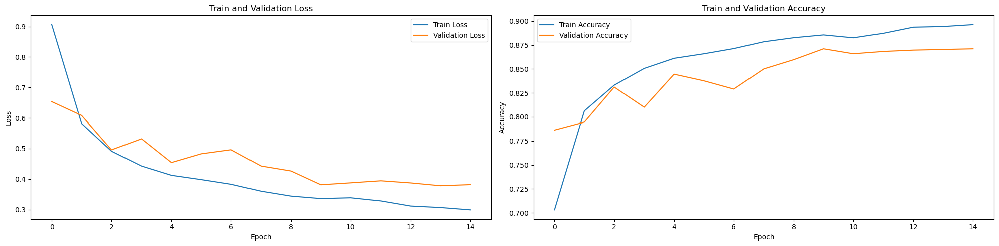

In [13]:
plt.figure(figsize = (20,5))
# Accuracy plot
plt.subplot(1,2,2)
plt.title("Train and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(result_model.history['accuracy'], label="Train Accuracy")
plt.plot(result_model.history['val_accuracy'], label="Validation Accuracy")
plt.legend()

# Loss plot
plt.subplot(1,2,1)
plt.title("Train and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(result_model.history['loss'],label="Train Loss")
plt.plot(result_model.history['val_loss'], label="Validation Loss")
plt.legend()
plt.tight_layout()

In [14]:
# Model Evaluation with new test data
print("Evaluating model...")
test_loss, test_accuracy = cnn.evaluate(testing_dataset)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Evaluating model...


2024-07-21 12:36:14.683808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


114/114 [==============================] - 48s 419ms/step - loss: 0.3898 - accuracy: 0.8661
Test Accuracy: 86.61%


In [15]:
# Predict labels for the test data
predictions = cnn.predict(testing_dataset)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = testing_dataset.classes

2024-07-21 12:37:02.772834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


114/114 [==============================] - 48s 420ms/step


In [16]:
print(predicted_labels)
print(true_labels)

[5 0 0 ... 9 9 9]
[0 0 0 ... 9 9 9]


In [19]:
# Display the model's performance

#Train Accuracy: retrieves the last recorded training accuracy from the training history
print("Train Accuracy: {:.2f} %".format(result_model.history['accuracy'][-1]*100))

#Test Accuracy: computes accuracy score by comparing true labels with predicted labels
print("Test Prediction Accuracy: {:.2f} %".format(accuracy_score(true_labels, predicted_labels) * 100))

#Precision Score: computes the precision score using the micro averaging strategy.
print("Precision Score: {:.2f} %".format(precision_score(true_labels, predicted_labels, average='macro',zero_division=1) * 100))

#Recall Score: computes the recall score using the micro averaging strategy
print("Recall Score: {:.2f} %".format(recall_score(true_labels, predicted_labels, average='macro',zero_division=1) * 100))

Train Accuracy: 89.64 %
Test Prediction Accuracy: 85.84 %
Precision Score: 82.57 %
Recall Score: 81.52 %


ValueError: The number of FixedLocator locations (10), usually from a call to set_ticks, does not match the number of labels (38).

<Figure size 2000x500 with 0 Axes>

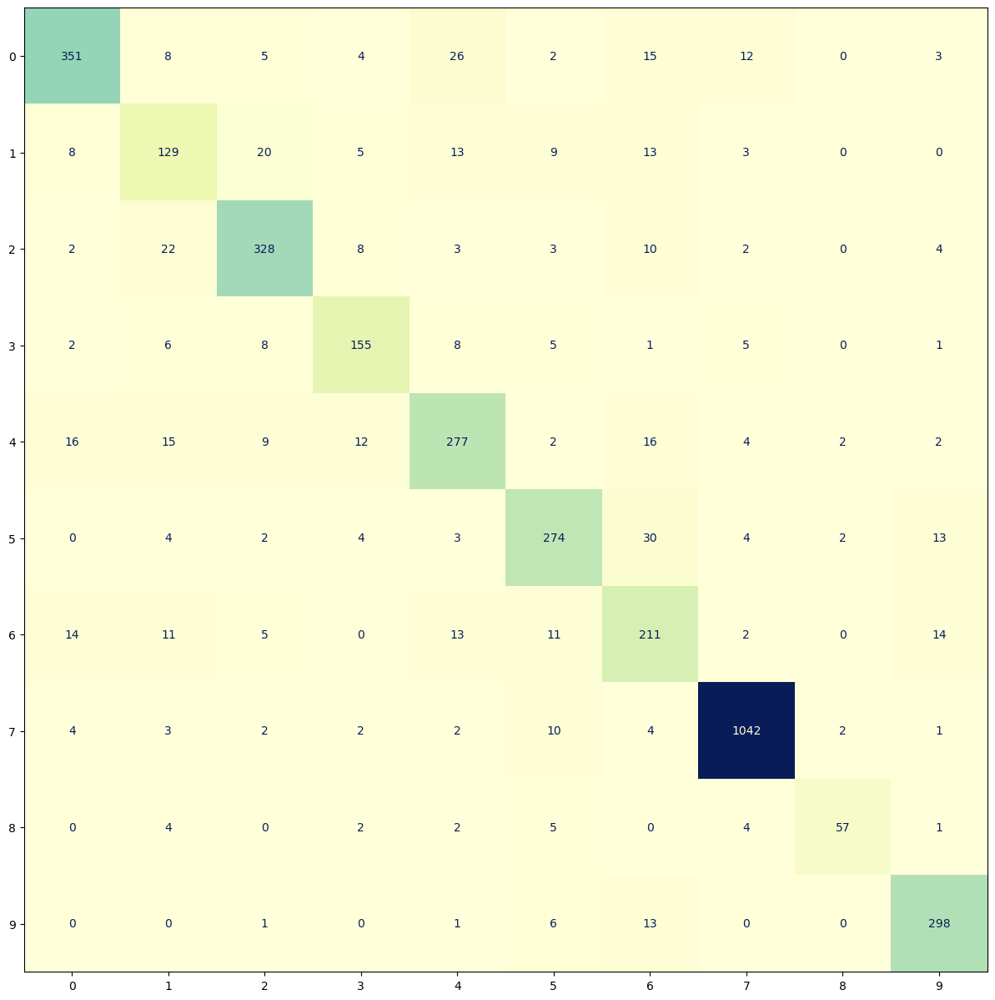

In [18]:
# Plot a confusion matrix
plt.figure(figsize= (20,5))
cm = confusion_matrix(true_labels, predicted_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=list(range(1,39)))
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,colorbar= False,cmap = 'YlGnBu')
plt.title("Confusion Matrix")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()